Sample code for calculating the Cross Entropies between HR and Temp for the first two subjects

In [2]:
import pandas as pd
import numpy as np
import matplotlib as plt
import pickle
import EntropyHub as EH
import gc 
import warnings
warnings.filterwarnings("ignore")

In [3]:
dropped_subjects = []

first_subject_id = 1
last_subject_id = 16 # We have 16 subjects in total, here just as an example I have only imported data from the first two subjects 


data_folder = 'new_data' # Change this to the folder in your PC with the saved data
folder_to_save = 'saved_2' # Folder to save computed entropies

#name of row
XEntropy_signals = 'hr+bvp' 


In [4]:
fs = {} # Dictionary to store sampling frequency of each signal
fs["acc"] = 32
fs["bvp"] = 64
fs["eda"] = 4
fs["temp"] = 4
fs["hr"]  = 1

epoch_seconds = 5 * 60 # 1 epoch is 5 minutes => 5min * 60 seconds/min = 300 seconds 

epoch_size = 300
# e4_dfs_list = {' hr',' temp', ' eda', ' acc', ' bvp'} 

e4_dfs_list = {'hr', 'bvp'}


In [5]:
segmented_dfs = {}
for subject_id in [id for id in range(first_subject_id, last_subject_id + 1) if id not in dropped_subjects]:
    segmented_dfs[subject_id] = pd.read_pickle(f'{data_folder}/segmented_df_{subject_id}_5MIN.pkl') 
    print(f'Loaded segmented df for subject {subject_id}.')

Loaded segmented df for subject 1.
Loaded segmented df for subject 2.
Loaded segmented df for subject 3.
Loaded segmented df for subject 4.
Loaded segmented df for subject 5.
Loaded segmented df for subject 6.
Loaded segmented df for subject 7.
Loaded segmented df for subject 8.
Loaded segmented df for subject 9.
Loaded segmented df for subject 10.
Loaded segmented df for subject 11.
Loaded segmented df for subject 12.
Loaded segmented df for subject 13.
Loaded segmented df for subject 14.
Loaded segmented df for subject 15.
Loaded segmented df for subject 16.


In [6]:
# Function to resample each nested dataframe
def resample_nested_df(nested_df, max_rows):
   
    resampled_df = nested_df.resample('1S').mean().tail(max_rows)
    
    return resampled_df 

In [7]:
for subject_id in [id for id in range(first_subject_id, last_subject_id + 1) if id not in dropped_subjects]:
    segmented_dfs[subject_id]['temp_segments'] = segmented_dfs[subject_id]['temp_segments'].apply(lambda x: resample_nested_df(x, max_rows=epoch_size))
    segmented_dfs[subject_id]['acc_segments'] = segmented_dfs[subject_id]['acc_segments'].apply(lambda x: resample_nested_df(x, max_rows=epoch_size))
    segmented_dfs[subject_id]['eda_segments'] = segmented_dfs[subject_id]['eda_segments'].apply(lambda x: resample_nested_df(x, max_rows=epoch_size))
    segmented_dfs[subject_id]['bvp_segments'] = segmented_dfs[subject_id]['bvp_segments'].apply(lambda x: resample_nested_df(x, max_rows=epoch_size))

Boxplots

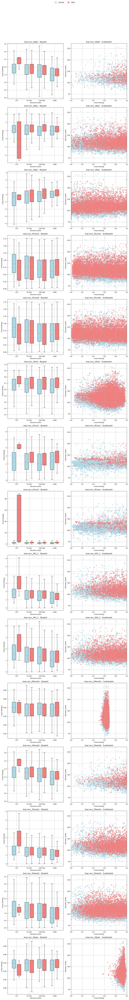

In [8]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np

subject_genders = {
    1: 'F', 
    2: 'M', 
    3: 'F', 
    4: 'F', 
    5: 'F', 
    6: 'F', 
    7: 'F', 
    8: 'F', 
    9: 'M',
    10: 'F', 
    11: 'M', 
    12: 'M', 
    13: 'M', 
    14: 'M', 
    15: 'F', 
    16: 'M'
}

# Subject genders
cross_folder = 'BVPACC'

features = ["bvp+acc_XAp0", "bvp+acc_XAp1", "bvp+acc_XAp2",
    "bvp+acc_XCond1", "bvp+acc_XCond2",  
    "bvp+acc_XDist",
    "bvp+acc_XFuzz1","bvp+acc_XFuzz2",
    "bvp+acc_XK2_1",  "bvp+acc_XK2_2", 
    "bvp+acc_XPermEn",
    "bvp+acc_XSamp0","bvp+acc_XSamp1", "bvp+acc_XSamp2",
    "bvp+acc_XSpec"]



feature_data = {feature: {'F': {1: [], 2: [], 3: [], 4: []}, 'M': {1: [], 2: [], 3: [], 4: []}} for feature in features}
scatter_data = {feature: {'F': [], 'M': []} for feature in features}

# Read CSV files and populate the data structures
for subject_id, gender in subject_genders.items():
    csv_file = os.path.join(cross_folder, f'bvp+acc_{subject_id}.csv')
    
    if os.path.exists(csv_file): 
        csv_data = pd.read_csv(csv_file)
    
        for i in range(len(segmented_dfs[subject_id])): 
            glucose = segmented_dfs[subject_id]['glucose'].iloc[i]
            if glucose < 70:
                glucose_level = 1
            elif 70 <= glucose < 140:
                glucose_level = 2
            elif 140 <= glucose < 180:
                glucose_level = 3
            else:
                glucose_level = 4
                
            for feature in features:
                if feature in csv_data.columns:
                    value = csv_data[feature].iloc[i]
                    if np.isfinite(value):
                        feature_data[feature][gender][glucose_level].append(value)
                        scatter_data[feature][gender].append((value, glucose))

fig, axes = plt.subplots(len(features), 2, figsize=(12, len(features) * 6))  
colors = {'F': 'lightblue', 'M': 'lightcoral'}

for ax, feature in zip(axes, features):
    data_female = [feature_data[feature]['F'][level] for level in range(1, 5)]
    data_male = [feature_data[feature]['M'][level] for level in range(1, 5)]

    # Boxplot
    box_ax = ax[0]
    box_ax.boxplot(data_female, positions=[x - 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['F'], edgecolor='black'))
    box_ax.boxplot(data_male, positions=[x + 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['M'], edgecolor='black'))
    

    box_ax.set_title(f'{feature} - Boxplot')
    box_ax.set_xlabel('Glucose Levels')  
    box_ax.set_ylabel('Cross Entropy')  
    box_ax.set_xticks(range(1, 5))
    box_ax.set_xticklabels(['<70', '70-140', '140-180', '>180']) 
    box_ax.grid(True)

    # Scatterplot
    scatter_ax = ax[1]
    female_data = scatter_data[feature]['F']
    male_data = scatter_data[feature]['M']
    
    all_data = female_data + male_data

    scatter_ax.scatter([x[0] for x in female_data], [x[1] for x in female_data], color=colors['F'], label='Female', alpha=0.5)
    scatter_ax.scatter([x[0] for x in male_data], [x[1] for x in male_data], color=colors['M'], label='Male', alpha=0.5)
    scatter_ax.set_title(f'{feature} - Scatterplot')
    scatter_ax.set_xlabel('Cross Entropy')  
    scatter_ax.set_ylabel('Glucose Levels') 
    scatter_ax.set_xlim(0, 1)  
    scatter_ax.grid(True)

# Add legend
legend_handles = [
    mlines.Line2D([], [], color=colors['F'], marker='o', linestyle='None', markersize=10, label='Female'),
    mlines.Line2D([], [], color=colors['M'], marker='o', linestyle='None', markersize=10, label='Male')
]

fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


F/M  direction-dependent

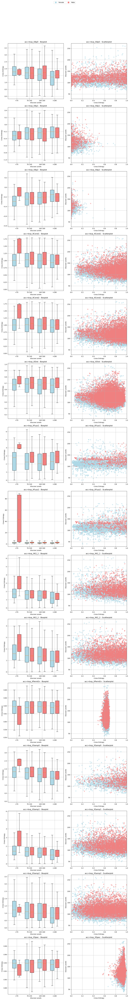

In [9]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np

subject_genders = {
    1: 'F', 
    2: 'M', 
    3: 'F', 
    4: 'F', 
    5: 'F', 
    6: 'F', 
    7: 'F', 
    8: 'F', 
    9: 'M',
    10: 'F', 
    11: 'M', 
    12: 'M', 
    13: 'M', 
    14: 'M', 
    15: 'F', 
    16: 'M'
}

cross_folder = 'BVPACC\ACCBVP'

features = ["acc+bvp_XAp0", "acc+bvp_XAp1", "acc+bvp_XAp2",
    "acc+bvp_XCond1", "acc+bvp_XCond2",  
    "acc+bvp_XDist",
    "acc+bvp_XFuzz1","acc+bvp_XFuzz2",
    "acc+bvp_XK2_1",  "acc+bvp_XK2_2", 
    "acc+bvp_XPermEn",
    "acc+bvp_XSamp0","acc+bvp_XSamp1", "acc+bvp_XSamp2",
    "acc+bvp_XSpec"]



feature_data = {feature: {'F': {1: [], 2: [], 3: [], 4: []}, 'M': {1: [], 2: [], 3: [], 4: []}} for feature in features}
scatter_data = {feature: {'F': [], 'M': []} for feature in features}

# Read CSV files and populate the data structures
for subject_id, gender in subject_genders.items():
    csv_file = os.path.join(cross_folder, f'acc+bvp_{subject_id}.csv')
    
    if os.path.exists(csv_file): 
        csv_data = pd.read_csv(csv_file)
    
        for i in range(len(segmented_dfs[subject_id])): 
            glucose = segmented_dfs[subject_id]['glucose'].iloc[i]
            if glucose < 70:
                glucose_level = 1
            elif 70 <= glucose < 140:
                glucose_level = 2
            elif 140 <= glucose < 180:
                glucose_level = 3
            else:
                glucose_level = 4
                
            for feature in features:
                if feature in csv_data.columns:
                    value = csv_data[feature].iloc[i]
                    if np.isfinite(value):
                        feature_data[feature][gender][glucose_level].append(value)
                        scatter_data[feature][gender].append((value, glucose))

fig, axes = plt.subplots(len(features), 2, figsize=(12, len(features) * 6))  
colors = {'F': 'lightblue', 'M': 'lightcoral'}

for ax, feature in zip(axes, features):
    data_female = [feature_data[feature]['F'][level] for level in range(1, 5)]
    data_male = [feature_data[feature]['M'][level] for level in range(1, 5)]

    # Boxplot
    box_ax = ax[0]
    box_ax.boxplot(data_female, positions=[x - 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['F'], edgecolor='black'))
    box_ax.boxplot(data_male, positions=[x + 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['M'], edgecolor='black'))
    

    box_ax.set_title(f'{feature} - Boxplot')
    box_ax.set_xlabel('Glucose Levels')  
    box_ax.set_ylabel('Cross Entropy')  
    box_ax.set_xticks(range(1, 5))
    box_ax.set_xticklabels(['<70', '70-140', '140-180', '>180']) 
    box_ax.grid(True)

    # Scatterplot
    scatter_ax = ax[1]
    female_data = scatter_data[feature]['F']
    male_data = scatter_data[feature]['M']
    
    all_data = female_data + male_data

    scatter_ax.scatter([x[0] for x in female_data], [x[1] for x in female_data], color=colors['F'], label='Female', alpha=0.5)
    scatter_ax.scatter([x[0] for x in male_data], [x[1] for x in male_data], color=colors['M'], label='Male', alpha=0.5)
    scatter_ax.set_title(f'{feature} - Scatterplot')
    scatter_ax.set_xlabel('Cross Entropy')  
    scatter_ax.set_ylabel('Glucose Levels') 
    scatter_ax.set_xlim(0, 1)  
    scatter_ax.grid(True)

# Add legend
legend_handles = [
    mlines.Line2D([], [], color=colors['F'], marker='o', linestyle='None', markersize=10, label='Female'),
    mlines.Line2D([], [], color=colors['M'], marker='o', linestyle='None', markersize=10, label='Male')
]

fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


HN PD 

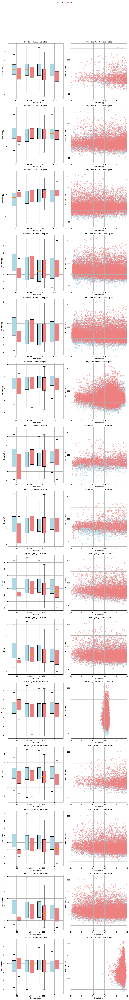

In [10]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np 

subject_genders = {
    1: 'HN', 2: 'HN', 3: 'PD', 4: 'PD', 5: 'PD', 6: 'PD', 7: 'HN', 8: 'HN', 9: 'PD', 
    10: 'PD', 11: 'PD', 12: 'HN', 13: 'PD', 14: 'HN', 15: 'HN', 16: 'HN'
}

cross_folder = 'BVPACC'

features = ["bvp+acc_XAp0", "bvp+acc_XAp1", "bvp+acc_XAp2",
    "bvp+acc_XCond1", "bvp+acc_XCond2",  
    "bvp+acc_XDist",
    "bvp+acc_XFuzz1","bvp+acc_XFuzz2",
    "bvp+acc_XK2_1",  "bvp+acc_XK2_2", 
    "bvp+acc_XPermEn",
    "bvp+acc_XSamp0","bvp+acc_XSamp1", "bvp+acc_XSamp2",
    "bvp+acc_XSpec"]

feature_data = {feature: {'HN': {1: [], 2: [], 3: [], 4: []}, 'PD': {1: [], 2: [], 3: [], 4: []}} for feature in features}
scatter_data = {feature: {'HN': [], 'PD': []} for feature in features}

# Read CSV files and populate the data structures
for subject_id, gender in subject_genders.items():
    csv_file = os.path.join(cross_folder, f'bvp+acc_{subject_id}.csv')
    
    if os.path.exists(csv_file): 
        csv_data = pd.read_csv(csv_file)
        
        for i in range(len(segmented_dfs[subject_id])):  
            glucose = segmented_dfs[subject_id]['glucose'].iloc[i]
            if glucose < 70:
                glucose_level = 1
            elif 70 <= glucose < 140:
                glucose_level = 2
            elif 140 <= glucose < 180:
                glucose_level = 3
            else:
                glucose_level = 4
                
            for feature in features:
                if feature in csv_data.columns:
                    value = csv_data[feature].iloc[i]
                    if np.isfinite(value):
                        feature_data[feature][gender][glucose_level].append(value)
                        scatter_data[feature][gender].append((value, glucose))

fig, axes = plt.subplots(len(features), 2, figsize=(12, len(features) * 6))  
colors = {'HN': 'lightblue', 'PD': 'lightcoral'}

for ax, feature in zip(axes, features):
    data_HN = [feature_data[feature]['HN'][level] for level in range(1, 5)]
    data_PD = [feature_data[feature]['PD'][level] for level in range(1, 5)]

    # Boxplot
    box_ax = ax[0]
    box_ax.boxplot(data_HN, positions=[x - 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['HN'], edgecolor='black'))
    box_ax.boxplot(data_PD, positions=[x + 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['PD'], edgecolor='black'))
    

    box_ax.set_title(f'{feature} - Boxplot')
    box_ax.set_xlabel('Glucose Levels')  
    box_ax.set_ylabel('Cross Entropy')  
    box_ax.set_xticks(range(1, 5))
    box_ax.set_xticklabels(['<70', '70-140', '140-180', '>180']) 
    box_ax.grid(True)

    # Scatterplot
    scatter_ax = ax[1]
    HN_data = scatter_data[feature]['HN']
    PD_data = scatter_data[feature]['PD']
    
    all_data = HN_data + PD_data

    scatter_ax.scatter([x[0] for x in HN_data], [x[1] for x in HN_data], color=colors['HN'], label='HN', alpha=0.5)
    scatter_ax.scatter([x[0] for x in PD_data], [x[1] for x in PD_data], color=colors['PD'], label='PD', alpha=0.5)
    scatter_ax.set_title(f'{feature} - Scatterplot')
    scatter_ax.set_xlabel('Cross Entropy')  
    scatter_ax.set_ylabel('Glucose Levels') 
    scatter_ax.set_xlim(0, 1)  
    scatter_ax.grid(True)

# Add legend
legend_handles = [
    mlines.Line2D([], [], color=colors['HN'], marker='o', linestyle='None', markersize=10, label='HN'),
    mlines.Line2D([], [], color=colors['PD'], marker='o', linestyle='None', markersize=10, label='PD')
]

fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


In [11]:
#N/PD  direction-dependent

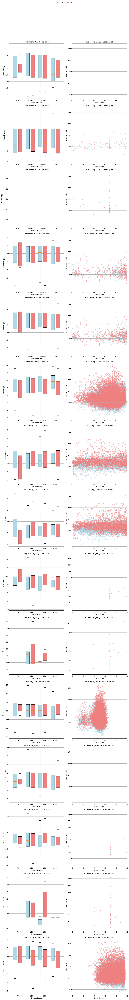

In [14]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np 

subject_genders = {
    1: 'HN', 2: 'HN', 3: 'PD', 4: 'PD', 5: 'PD', 6: 'PD', 7: 'HN', 8: 'HN', 9: 'PD', 
    10: 'PD', 11: 'PD', 12: 'HN', 13: 'PD', 14: 'HN', 15: 'HN', 16: 'HN'
}

cross_folder = 'TEMP\TEMPBVP\BVPTEMP'

features = ["bvp+temp_XAp0", "bvp+temp_XAp1", "bvp+temp_XAp2",
    "bvp+temp_XCond1", "bvp+temp_XCond2",  
    "bvp+temp_XDist",
    "bvp+temp_XFuzz1","bvp+temp_XFuzz2",
    "bvp+temp_XK2_1",  "bvp+temp_XK2_2", 
    "bvp+temp_XPermEn",
    "bvp+temp_XSamp0","bvp+temp_XSamp1", "bvp+temp_XSamp2",
    "bvp+temp_XSpec"]


feature_data = {feature: {'HN': {1: [], 2: [], 3: [], 4: []}, 'PD': {1: [], 2: [], 3: [], 4: []}} for feature in features}
scatter_data = {feature: {'HN': [], 'PD': []} for feature in features}

# Read CSV files and populate the data structures
for subject_id, gender in subject_genders.items():
    csv_file = os.path.join(cross_folder, f'bvp+temp_{subject_id}.csv')
    
    if os.path.exists(csv_file): 
        csv_data = pd.read_csv(csv_file)
        
        for i in range(len(segmented_dfs[subject_id])):  
            glucose = segmented_dfs[subject_id]['glucose'].iloc[i]
            if glucose < 70:
                glucose_level = 1
            elif 70 <= glucose < 140:
                glucose_level = 2
            elif 140 <= glucose < 180:
                glucose_level = 3
            else:
                glucose_level = 4
                
            for feature in features:
                if feature in csv_data.columns:
                    value = csv_data[feature].iloc[i]
                    if np.isfinite(value):
                        feature_data[feature][gender][glucose_level].append(value)
                        scatter_data[feature][gender].append((value, glucose))

fig, axes = plt.subplots(len(features), 2, figsize=(12, len(features) * 6))  
colors = {'HN': 'lightblue', 'PD': 'lightcoral'}

for ax, feature in zip(axes, features):
    data_HN = [feature_data[feature]['HN'][level] for level in range(1, 5)]
    data_PD = [feature_data[feature]['PD'][level] for level in range(1, 5)]

    # Boxplot
    box_ax = ax[0]
    box_ax.boxplot(data_HN, positions=[x - 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['HN'], edgecolor='black'))
    box_ax.boxplot(data_PD, positions=[x + 0.2 for x in range(1, 5)], widths=0.3, sym='',
                patch_artist=True, boxprops=dict(facecolor=colors['PD'], edgecolor='black'))
    

    box_ax.set_title(f'{feature} - Boxplot')
    box_ax.set_xlabel('Glucose Levels')  
    box_ax.set_ylabel('Cross Entropy')  
    box_ax.set_xticks(range(1, 5))
    box_ax.set_xticklabels(['<70', '70-140', '140-180', '>180']) 
    box_ax.grid(True)

    # Scatterplot
    scatter_ax = ax[1]
    HN_data = scatter_data[feature]['HN']
    PD_data = scatter_data[feature]['PD']
    
    all_data = HN_data + PD_data

    scatter_ax.scatter([x[0] for x in HN_data], [x[1] for x in HN_data], color=colors['HN'], label='HN', alpha=0.5)
    scatter_ax.scatter([x[0] for x in PD_data], [x[1] for x in PD_data], color=colors['PD'], label='PD', alpha=0.5)
    scatter_ax.set_title(f'{feature} - Scatterplot')
    scatter_ax.set_xlabel('Cross Entropy')  
    scatter_ax.set_ylabel('Glucose Levels') 
    scatter_ax.set_xlim(0, 1)  
    scatter_ax.grid(True)

# Add legend
legend_handles = [
    mlines.Line2D([], [], color=colors['HN'], marker='o', linestyle='None', markersize=10, label='HN'),
    mlines.Line2D([], [], color=colors['PD'], marker='o', linestyle='None', markersize=10, label='PD')
]

fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()
